### Connecting to Kaggle

In [1]:
from google.colab import files

files.upload()

! mkdir ~/.kaggle

! cp kaggle.json ~/.kaggle/

! chmod 600 ~/.kaggle/kaggle.json

Saving kaggle.json to kaggle.json


### Downloading the Dataset

In [2]:
!kaggle datasets download -d fushenggg/3-class-cat-dog-car-dataset

 79% 97.0M/123M [00:00<00:00, 129MB/s] 
100% 123M/123M [00:00<00:00, 137MB/s] 


In [3]:
!unzip /content/3-class-cat-dog-car-dataset.zip

Archive:  /content/3-class-cat-dog-car-dataset.zip
  inflating: catdogcar2.hdf5         
  inflating: cats_dogs_cars/cats_dogs_cars/data/car.0.jpg  
  inflating: cats_dogs_cars/cats_dogs_cars/data/car.1.jpg  
  inflating: cats_dogs_cars/cats_dogs_cars/data/car.10.jpg  
  inflating: cats_dogs_cars/cats_dogs_cars/data/car.100.jpg  
  inflating: cats_dogs_cars/cats_dogs_cars/data/car.101.jpg  
  inflating: cats_dogs_cars/cats_dogs_cars/data/car.102.jpg  
  inflating: cats_dogs_cars/cats_dogs_cars/data/car.103.jpg  
  inflating: cats_dogs_cars/cats_dogs_cars/data/car.104.jpg  
  inflating: cats_dogs_cars/cats_dogs_cars/data/car.105.jpg  
  inflating: cats_dogs_cars/cats_dogs_cars/data/car.106.jpg  
  inflating: cats_dogs_cars/cats_dogs_cars/data/car.107.jpg  
  inflating: cats_dogs_cars/cats_dogs_cars/data/car.108.jpg  
  inflating: cats_dogs_cars/cats_dogs_cars/data/car.109.jpg  
  inflating: cats_dogs_cars/cats_dogs_cars/data/car.11.jpg  
  inflating: cats_dogs_cars/cats_dogs_cars/data/c

### Importing Dependencies

In [4]:
import numpy as np
import pandas as pd

import os
from pathlib import Path

import matplotlib.pyplot as plt
import cv2
import tensorflow as tf

from tensorflow.keras.layers import Dense, Input, Flatten, Conv2D, MaxPool2D, BatchNormalization, AveragePooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.applications import ResNet50, VGG19

from sklearn.model_selection import train_test_split


from tqdm import tqdm

### Clean Function

In [5]:
def clean_data(fname):

  target_size = (224, 224)
  img = plt.imread(fname)

  img = cv2.resize(img, target_size) 
  # Normalization
  img = img/255.0
  return img

### Taking Dataset

In [6]:
data_dir = Path(r"/content/cats_dogs_cars/cats_dogs_cars/data")

labels = {"car": 0, "cat": 1, "dog": 2}

X = []

y = []

for fname in tqdm(os.listdir(data_dir)):

  img = clean_data(data_dir / fname)

  X.extend([img])
  y.extend([labels[fname.split(".")[0]]])

X = np.array(X)
y = np.array(y)

100%|██████████| 3000/3000 [00:09<00:00, 321.25it/s]


### Splitting Data into Train/Test/Val

In [7]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, shuffle=True, stratify=y)
# X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.1, random_state=42, shuffle=True, stratify=y)

In [11]:
y_train[0]

2

### Model Building

In [ ]:
def build_model():

  inputs = Input(shape=X_train[0].shape, name="Input Layer")

  x = Conv2D(filters=256, kernel_size=(5, 5), strides=(1, 1), padding="valid", activation="relu")(inputs)
  x = MaxPool2D(pool_size=(2,2))(x)
  x = BatchNormalization()(x)

  x = Conv2D(filters=128, kernel_size=(5, 5), strides=(1, 1), padding="valid", activation="relu")(x)
  x = MaxPool2D(pool_size=(2,2))(x)
  x = BatchNormalization()(x)

  x = Flatten()(x)
  x = Dense(units=512, activation="relu")(x)

  outputs = Dense(units=3, activation="softmax")(x)
  # Building Model

  model = Model(inputs=inputs, outputs=outputs)

  model.summary()

  tf.keras.utils.plot_model(model, "model.png", show_shapes=True, show_dtype=True, dpi=300, expand_nested=True,
                            show_layer_activations=True)
  
  return model

### Fine-Tuning ResNet50

In [ ]:
baseModel = VGG19(weights="imagenet", include_top=False, input_tensor=Input(shape=(224, 224, 3)))

# Freeze all the layers
for layer in baseModel.layers[:]:
    layer.trainable = False


headModel = baseModel.output
# headModel = AveragePooling2D(pool_size=(7, 7))(headModel)
headModel = Flatten(name="flatten")(headModel)
headModel = Dense(256, activation="relu")(headModel)
headModel = Dropout(0.5)(headModel)
headModel = Dense(3, activation="softmax")(headModel)

model = Model(inputs=baseModel.input, outputs=headModel)

In [ ]:
# model = build_model()

### Model Compiling

In [ ]:
model.compile(optimizer="adam", loss="sparse_categorical_crossentropy", metrics=["accuracy"])

### Callbacks

In [ ]:
def callbacks():

  earlystopping = EarlyStopping(monitor="val_loss", patience=5, mode="min", verbose=1, restore_best_weights=True)

  checkpoint = ModelCheckpoint("model.hdf5", monitor='val_loss', verbose=1, save_best_only=True,  mode='min', save_freq='epoch')

  lr = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=3, verbose=1, mode='min', min_delta=0.0001, cooldown=0, min_lr=0)

  return [earlystopping, checkpoint, lr]

### Model Training

In [ ]:
model.fit(X_train, y_train, epochs=30, verbose=1, validation_data=(X_test, y_test),
          batch_size=16, shuffle=True, validation_batch_size=16, callbacks=callbacks())

Epoch 1/10
150/150 [==============================] - ETA: 0s - loss: 0.8927 - accuracy: 0.7833
Epoch 1: val_loss improved from inf to 0.24185, saving model to model.hdf5
150/150 [==============================] - 48s 249ms/step - loss: 0.8927 - accuracy: 0.7833 - val_loss: 0.2418 - val_accuracy: 0.8983 - lr: 0.0010
Epoch 2/10
150/150 [==============================] - ETA: 0s - loss: 0.2686 - accuracy: 0.8900
Epoch 2: val_loss improved from 0.24185 to 0.22546, saving model to model.hdf5
150/150 [==============================] - 34s 229ms/step - loss: 0.2686 - accuracy: 0.8900 - val_loss: 0.2255 - val_accuracy: 0.9050 - lr: 0.0010
Epoch 3/10
150/150 [==============================] - ETA: 0s - loss: 0.2233 - accuracy: 0.8996
Epoch 3: val_loss improved from 0.22546 to 0.18682, saving model to model.hdf5
150/150 [==============================] - 34s 229ms/step - loss: 0.2233 - accuracy: 0.8996 - val_loss: 0.1868 - val_accuracy: 0.9183 - lr: 0.0010
Epoch 4/10
150/150 [==================

### Model Prediction

In [ ]:
lmodel = tf.keras.models.load_model("/content/model.hdf5")

def predict(fname):

  classes = ["car", "cat", "dog"]

  test = clean_data(fname)

  pred = lmodel.predict(np.array([test, ]))

  pred = np.argmax(pred, axis=-1)[0]

  pred = classes[pred]

  plt.title(f"Predicted Class is {pred}")

  plt.imshow(test)

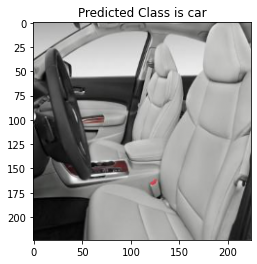

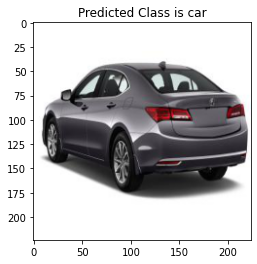

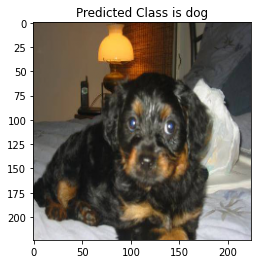

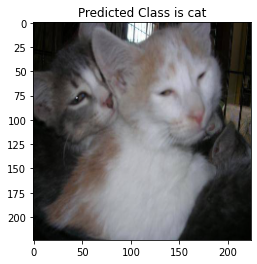

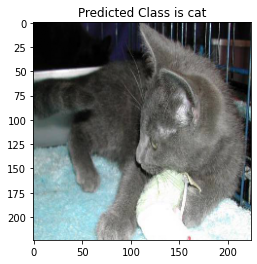

...

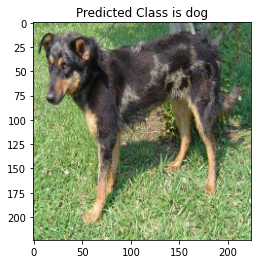

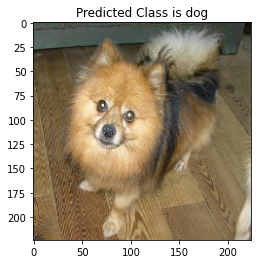

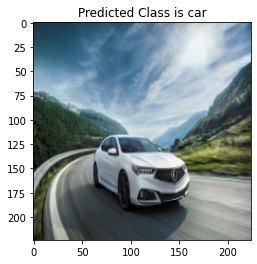

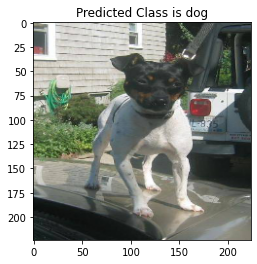

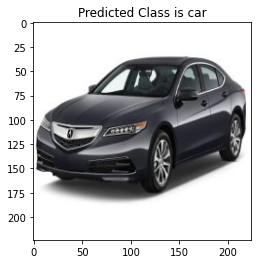

In [ ]:
for img in os.listdir("/content/cats_dogs_cars/cats_dogs_cars/test/"):
  predict(f"/content/cats_dogs_cars/cats_dogs_cars/test/{img}")
  plt.show()